* preprocessing 팁
https://teddylee777.github.io/scikit-learn/sklearn%EC%99%80-pandas%EB%A5%BC-%ED%99%9C%EC%9A%A9%ED%95%9C-%EA%B0%84%EB%8B%A8-%EB%8D%B0%EC%9D%B4%ED%84%B0%EB%B6%84%EC%84%9D

In [1]:
import numpy as np
import pandas as pd
import math

import seaborn as sns
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from scipy.stats import chi2_contingency
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
train = pd.read_csv('../data/train.csv', index_col='id')
test = pd.read_csv('../data/test.csv', index_col='id')
submission = pd.read_csv('../data/sample_submission.csv', index_col='id')


In [3]:
train.head()

,rho,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,...,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst,hhb,hbo2,ca,na
id,,,,,,,,,,,,,,,,,,,,,
0,25,0.37950,0.42993,0.52076,0.57166,0.67818,0.75476,0.83580,0.93623,0.96333,...,NaN,0.000000e+00,NaN,1.067504e-18,5.998949e-18,4.378513e-17,5.59,4.32,8.92,4.29
1,10,0.00000,0.00000,0.01813,0.00000,0.00000,0.01974,0.00321,0.00000,0.00000,...,1.343132e-08,6.112685e-09,2.130547e-09,NaN,9.710091e-09,NaN,0.00,2.83,7.25,4.64
2,25,0.00000,0.03289,0.02416,0.03610,0.05843,0.09015,0.14944,0.18578,0.25584,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.329725e-18,NaN,10.64,3.00,8.40,5.16
3,10,0.27503,0.31281,0.32898,0.41041,0.46587,0.52769,0.64369,0.73562,0.79865,...,2.245998e-10,1.299511e-10,7.782625e-11,NaN,4.088921e-10,NaN,5.67,4.01,5.05,4.35
4,15,1.01521,1.00872,0.98930,0.98874,1.01773,1.01632,1.00009,0.98217,1.01564,...,1.457955e-13,8.769053e-14,NaN,1.330237e-13,NaN,NaN,11.97,4.41,10.78,2.42


In [4]:
train.shape, test.shape

((10000, 75), (10000, 71))

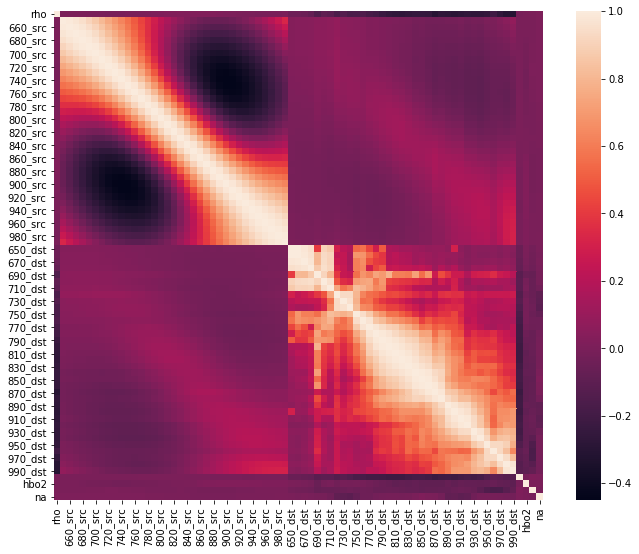

In [5]:
corrmat = train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, square=True)

In [6]:
def df_preview(df):
    for col in df.columns:
        print(col, "null count ::", df[col].isnull().sum(), "// mean ::", df[col].mean())

def df_col_distplot(df):
    for col in df.columns:
        print(col, "plot")
        sns.distplot(df.loc[df[col].notnull(), col])
        plt.title(col)
        plt.show()

def rmse_expm1(pred, true):
    return -np.sqrt(np.mean((np.expm1(pred)-np.expm1(true))**2))

In [7]:
# train['660_dst'].notnull()
# train['660_dst'][train['660_dst'].notnull()]
# train['660_dst'][train['660_dst'].notnull()].mean()

In [8]:
df_preview(train)

rho null count :: 0 // mean :: 17.568
650_src null count :: 0 // mean :: 0.18021249899999955
660_src null count :: 0 // mean :: 0.20352851099999977
670_src null count :: 0 // mean :: 0.22980399500000007
680_src null count :: 0 // mean :: 0.25915813400000137
690_src null count :: 0 // mean :: 0.2899746400000012
700_src null count :: 0 // mean :: 0.32224439500000024
710_src null count :: 0 // mean :: 0.3541009900000001
720_src null count :: 0 // mean :: 0.38449180900000035
730_src null count :: 0 // mean :: 0.4125027790000015
740_src null count :: 0 // mean :: 0.4368374179999996
750_src null count :: 0 // mean :: 0.45796715900000134
760_src null count :: 0 // mean :: 0.476572369999999
770_src null count :: 0 // mean :: 0.49215623199999875
780_src null count :: 0 // mean :: 0.5052036339999972
790_src null count :: 0 // mean :: 0.5148470179999993
800_src null count :: 0 // mean :: 0.5219983380000006
810_src null count :: 0 // mean :: 0.5262791020000013
820_src null count :: 0 // mean :: 0.

In [9]:
df_preview(test)

rho null count ::0 // mean :: 17.4955
650_src null count :: 0 // mean :: 0.18001893199999958
660_src null count :: 0 // mean :: 0.2036775269999996
670_src null count :: 0 // mean :: 0.23031899599999942
680_src null count :: 0 // mean :: 0.25981590500000057
690_src null count :: 0 // mean :: 0.2914956019999994
700_src null count :: 0 // mean :: 0.3238840910000007
710_src null count :: 0 // mean :: 0.35667272999999994
720_src null count :: 0 // mean :: 0.3875887690000001
730_src null count :: 0 // mean :: 0.4160700510000016
740_src null count :: 0 // mean :: 0.44119599600000176
750_src null count :: 0 // mean :: 0.46223086900000127
760_src null count :: 0 // mean :: 0.4798151260000006
770_src null count :: 0 // mean :: 0.4936322340000005
780_src null count :: 0 // mean :: 0.5043359740000034
790_src null count :: 0 // mean :: 0.5125984830000011
800_src null count :: 0 // mean :: 0.5186787470000013
810_src null count :: 0 // mean :: 0.5217899459999987
820_src null count :: 0 // mean :: 0.5

In [10]:
concat_df = pd.concat([train, test])
concat_df.shape

(20000, 75)

In [11]:
concat_df

,rho,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,...,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst,hhb,hbo2,ca,na
id,,,,,,,,,,,,,,,,,,,,,
0,25,0.37950,0.42993,0.52076,0.57166,0.67818,0.75476,0.83580,0.93623,0.96333,...,NaN,0.000000e+00,NaN,1.067504e-18,5.998949e-18,4.378513e-17,5.59,4.32,8.92,4.29
1,10,0.00000,0.00000,0.01813,0.00000,0.00000,0.01974,0.00321,0.00000,0.00000,...,1.343132e-08,6.112685e-09,2.130547e-09,NaN,9.710091e-09,NaN,0.00,2.83,7.25,4.64
2,25,0.00000,0.03289,0.02416,0.03610,0.05843,0.09015,0.14944,0.18578,0.25584,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.329725e-18,NaN,10.64,3.00,8.40,5.16
3,10,0.27503,0.31281,0.32898,0.41041,0.46587,0.52769,0.64369,0.73562,0.79865,...,2.245998e-10,1.299511e-10,7.782625e-11,NaN,4.088921e-10,NaN,5.67,4.01,5.05,4.35
4,15,1.01521,1.00872,0.98930,0.98874,1.01773,1.01632,1.00009,0.98217,1.01564,...,1.457955e-13,8.769053e-14,NaN,1.330237e-13,NaN,NaN,11.97,4.41,10.78,2.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,15,0.04334,0.03279,0.05853,0.04070,0.07704,0.07859,0.06168,0.08903,0.08833,...,7.929664e-13,0.000000e+00,0.000000e+00,1.472213e-13,1.479745e-12,5.391520e-12,NaN,NaN,NaN,NaN
19996,25,0.00020,0.02009,0.01726,0.03816,0.08300,0.08681,0.15300,0.18099,0.24377,...,4.514449e-18,NaN,9.128300e-19,NaN,3.928314e-18,2.586781e-17,NaN,NaN,NaN,NaN
19997,15,0.00000,0.00000,0.00120,0.00000,0.04347,0.14882,0.40883,0.80365,1.01179,...,7.789652e-15,NaN,1.271388e-15,1.436617e-15,0.000000e+00,1.743751e-13,NaN,NaN,NaN,NaN


In [12]:
concat_feature = concat_df.drop(['rho','hhb', 'hbo2', 'ca', 'na'], axis=1)
concat_feature.shape, concat_df.shape

((20000, 70), (20000, 75))

In [13]:
concat_feature.describe()

,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,740_src,...,900_dst,910_dst,920_dst,930_dst,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,1.602500e+04,1.605100e+04,1.598100e+04,1.602200e+04,1.598300e+04,1.603800e+04,1.597200e+04,1.595500e+04,1.607000e+04,1.604300e+04
mean,0.180116,0.203603,0.230061,0.259487,0.290735,0.323064,0.355387,0.386040,0.414286,0.439017,...,7.846028e-11,6.873410e-11,6.605648e-11,8.369331e-11,7.554165e-11,4.350498e-11,2.580593e-11,4.296541e-11,1.175409e-10,2.431977e-10
std,0.271857,0.287738,0.305440,0.324165,0.341829,0.357381,0.369998,0.378534,0.382502,0.381759,...,3.646494e-10,3.233575e-10,3.200981e-10,3.990935e-10,3.796270e-10,2.349793e-10,1.684902e-10,2.509189e-10,5.270438e-10,1.052990e-09
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.007428,0.009628,0.011627,0.013530,0.016317,0.019207,0.026230,0.036815,0.050495,0.065153,...,3.350324e-19,1.101876e-19,8.930146e-20,4.330048e-19,1.633996e-19,0.000000e+00,0.000000e+00,0.000000e+00,6.372480e-18,6.211838e-17
50%,0.052735,0.065270,0.079895,0.097815,0.121050,0.149945,0.185090,0.224595,0.275130,0.332690,...,1.204560e-15,6.621512e-16,5.194919e-16,1.336700e-15,7.561832e-16,1.008188e-16,2.344639e-17,1.378140e-16,3.958813e-15,1.869058e-14
75%,0.223302,0.277872,0.340720,0.420477,0.511765,0.606440,0.698815,0.782040,0.837108,0.858900,...,1.358170e-12,1.172659e-12,1.008495e-12,1.373559e-12,1.142649e-12,3.802201e-13,1.314546e-13,3.421900e-13,2.564142e-12,7.229769e-12
max,1.019990,1.019970,1.019930,1.019890,1.020000,1.019970,1.020000,1.019940,1.019990,1.019970,...,1.167515e-08,1.215034e-08,1.288854e-08,1.400634e-08,1.481643e-08,6.492176e-09,5.773867e-09,9.173911e-09,1.390299e-08,2.682289e-08


In [14]:
df_preview(concat_feature)

650_src null count :: 0 // mean :: 0.18011571550000027
660_src null count :: 0 // mean :: 0.20360301900000033
670_src null count :: 0 // mean :: 0.2300614954999999
680_src null count :: 0 // mean :: 0.2594870195000006
690_src null count :: 0 // mean :: 0.2907351210000014
700_src null count :: 0 // mean :: 0.3230642430000031
710_src null count :: 0 // mean :: 0.355386859999999
720_src null count :: 0 // mean :: 0.38604028899999904
730_src null count :: 0 // mean :: 0.41428641499999996
740_src null count :: 0 // mean :: 0.4390167069999995
750_src null count :: 0 // mean :: 0.46009901400000236
760_src null count :: 0 // mean :: 0.47819374799999953
770_src null count :: 0 // mean :: 0.49289423300000035
780_src null count :: 0 // mean :: 0.5047698039999962
790_src null count :: 0 // mean :: 0.5137227504999984
800_src null count :: 0 // mean :: 0.520338542499998
810_src null count :: 0 // mean :: 0.5240345239999982
820_src null count :: 0 // mean :: 0.525279091
830_src null count :: 0 // mea

In [15]:
concat_feature.mean()

650_src    1.801157e-01
660_src    2.036030e-01
670_src    2.300615e-01
680_src    2.594870e-01
690_src    2.907351e-01
               ...     
950_dst    4.350498e-11
960_dst    2.580593e-11
970_dst    4.296541e-11
980_dst    1.175409e-10
990_dst    2.431977e-10
Length: 70, dtype: float64

In [16]:
# 평균값으로 nan 값 채우기
filled_feature = concat_feature.fillna(concat_feature.mean())

In [17]:
filled_feature.isnull().sum()

650_src    0
660_src    0
670_src    0
680_src    0
690_src    0
          ..
950_dst    0
960_dst    0
970_dst    0
980_dst    0
990_dst    0
Length: 70, dtype: int64

650_src plot


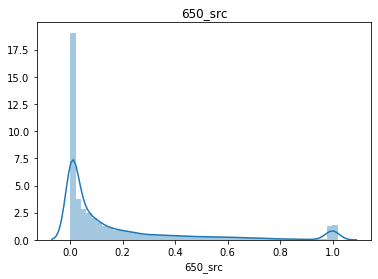

660_src plot


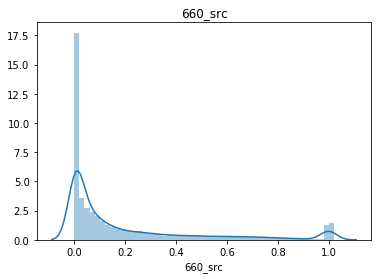

670_src plot


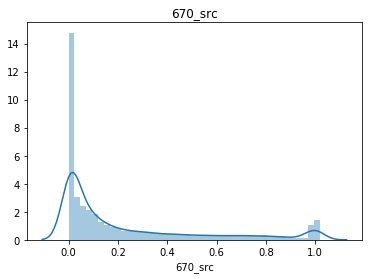

680_src plot


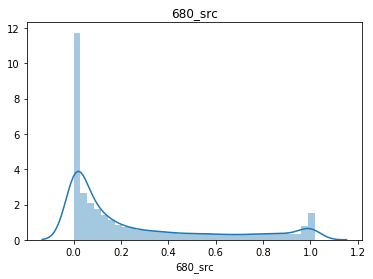

690_src plot


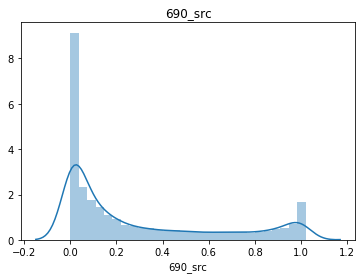

700_src plot


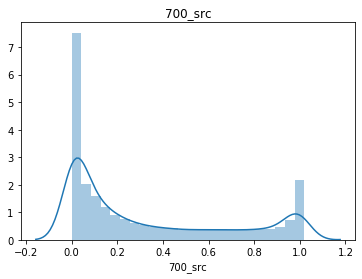

710_src plot


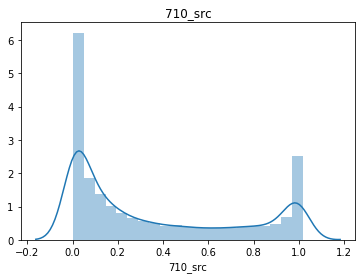

720_src plot


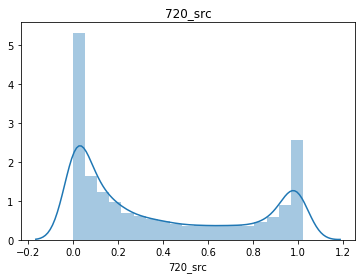

730_src plot


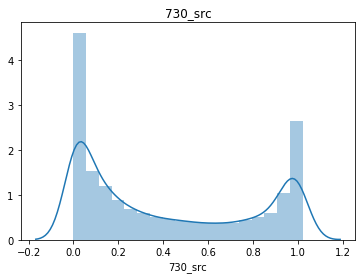

740_src plot


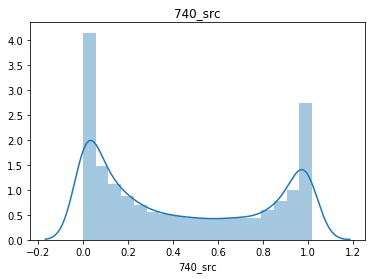

750_src plot


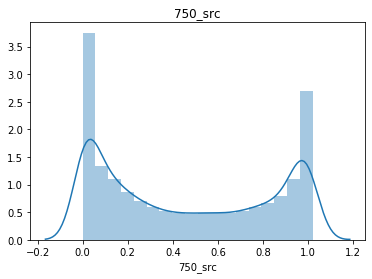

760_src plot


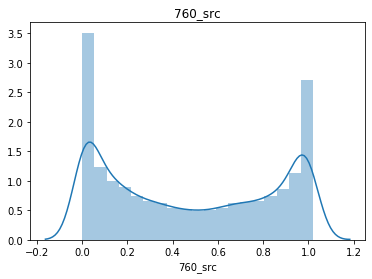

770_src plot


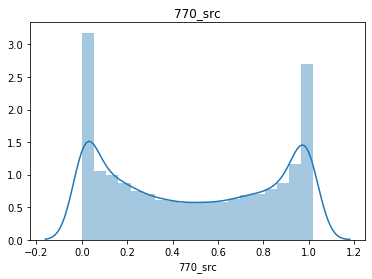

780_src plot


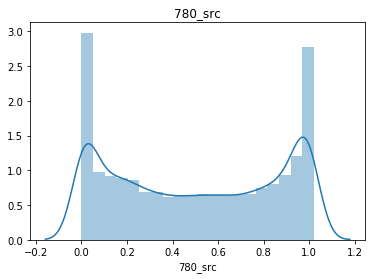

790_src plot


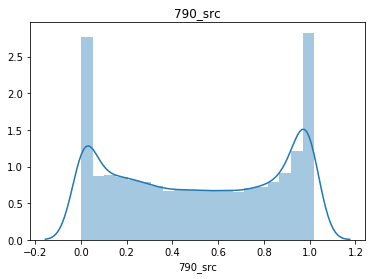

800_src plot


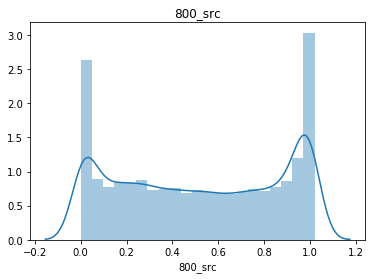

810_src plot


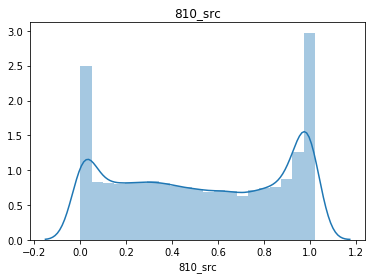

820_src plot


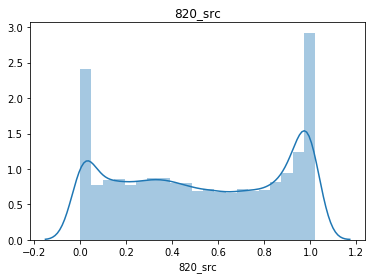

830_src plot


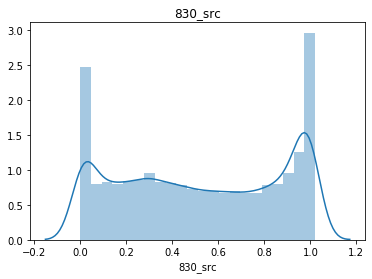

840_src plot


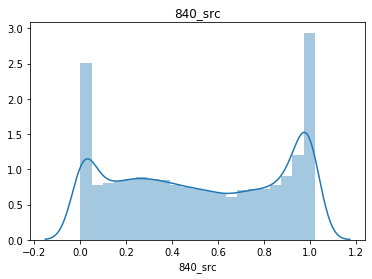

850_src plot


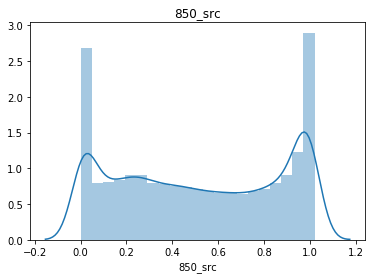

860_src plot


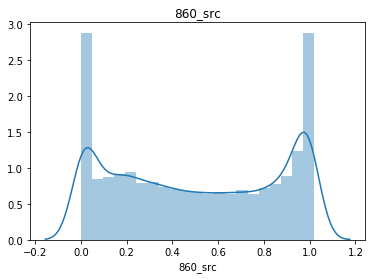

870_src plot


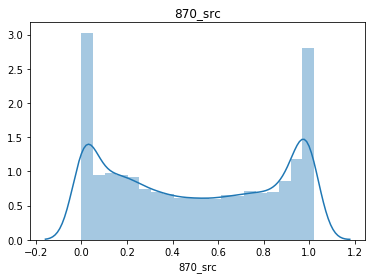

880_src plot


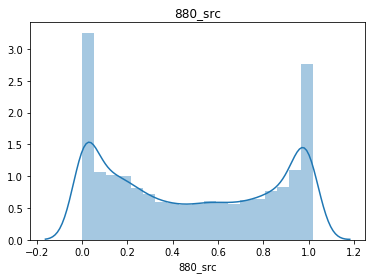

890_src plot


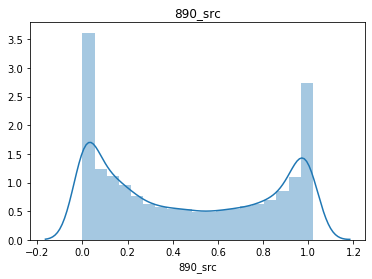

900_src plot


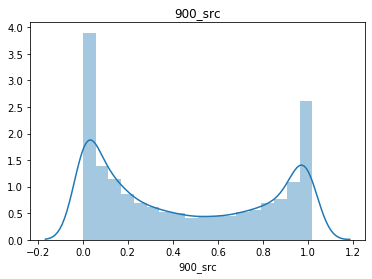

910_src plot


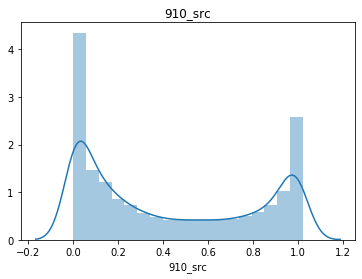

920_src plot


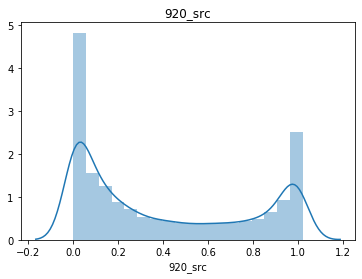

930_src plot


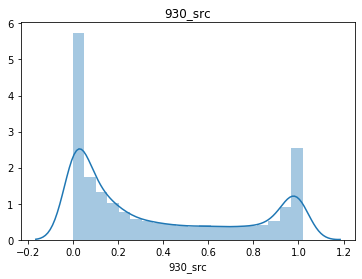

940_src plot


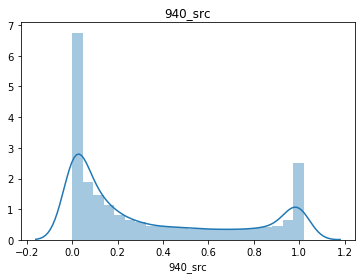

950_src plot


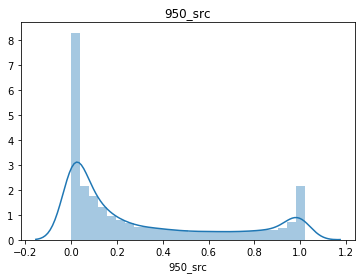

960_src plot


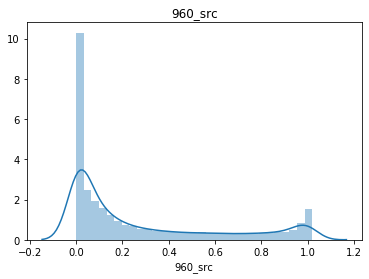

970_src plot


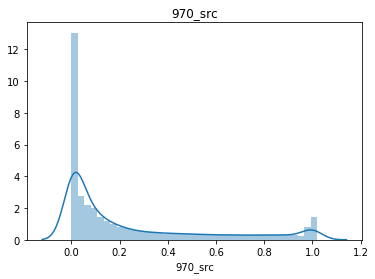

980_src plot


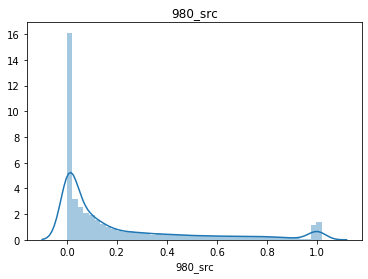

990_src plot


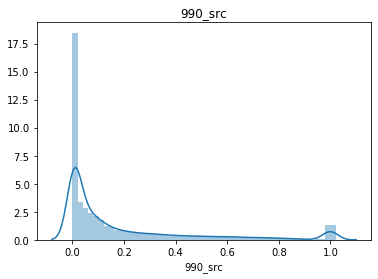

650_dst plot


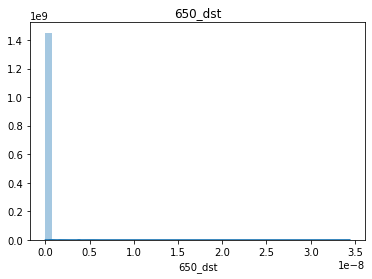

660_dst plot


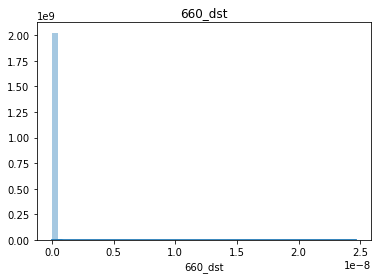

670_dst plot


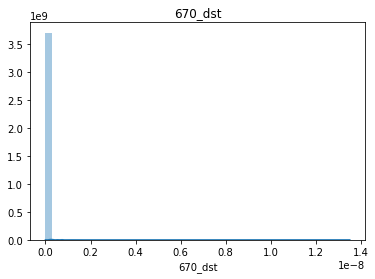

680_dst plot


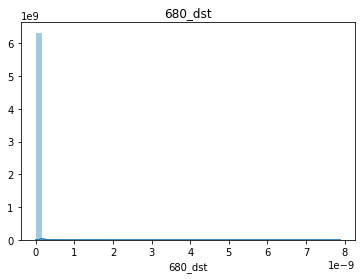

690_dst plot


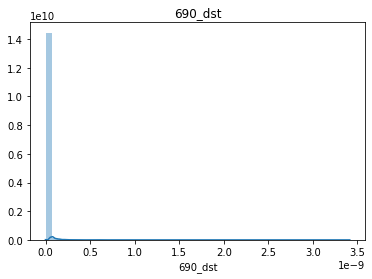

700_dst plot


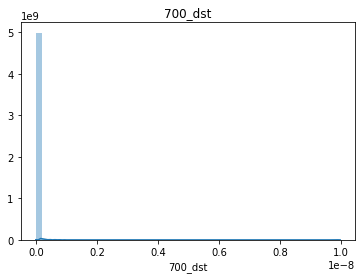

710_dst plot


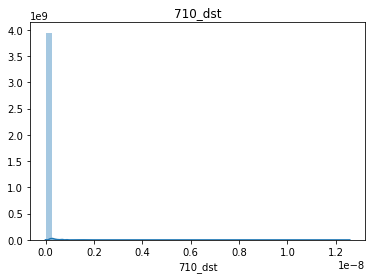

720_dst plot


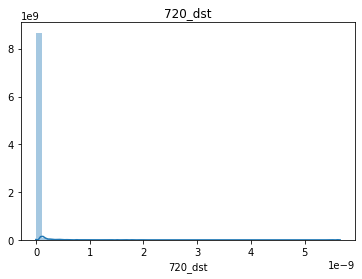

730_dst plot


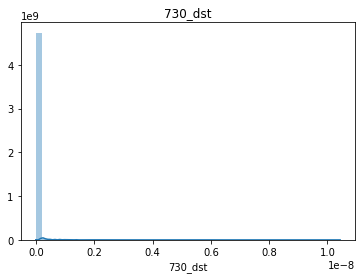

740_dst plot


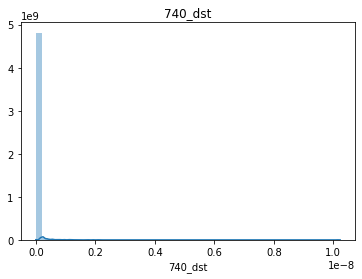

750_dst plot


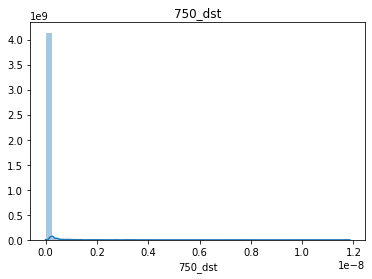

760_dst plot


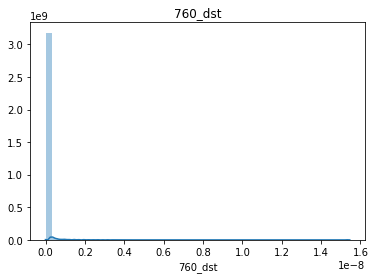

770_dst plot


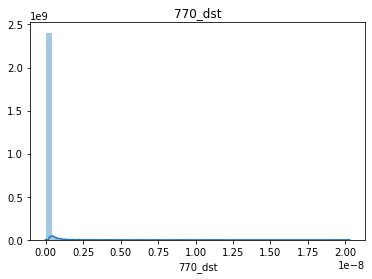

780_dst plot


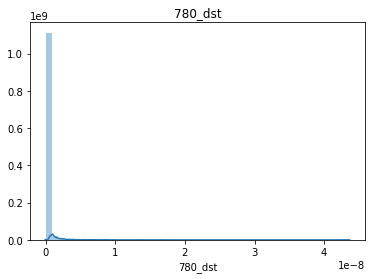

790_dst plot


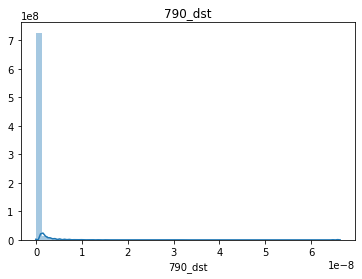

800_dst plot


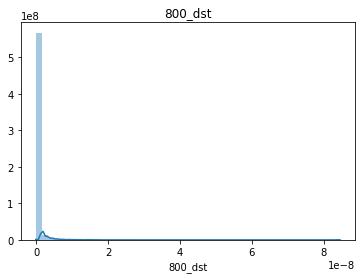

810_dst plot


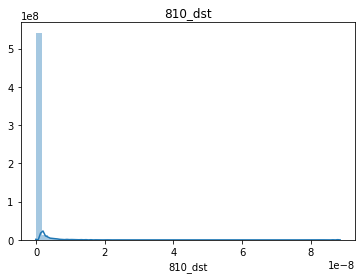

820_dst plot


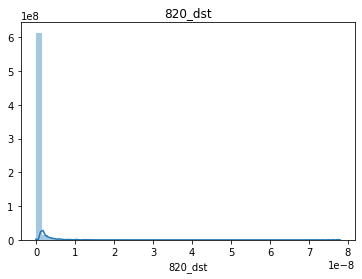

830_dst plot


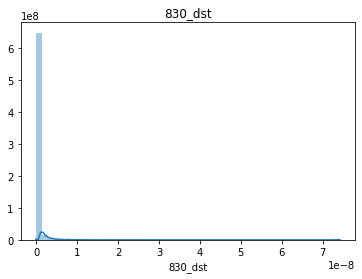

840_dst plot


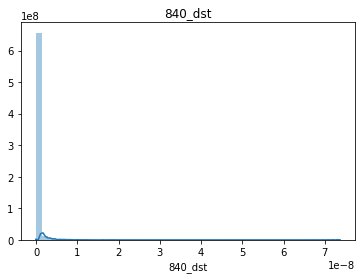

850_dst plot


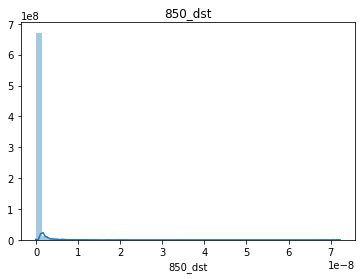

860_dst plot


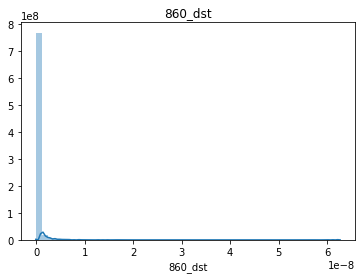

870_dst plot


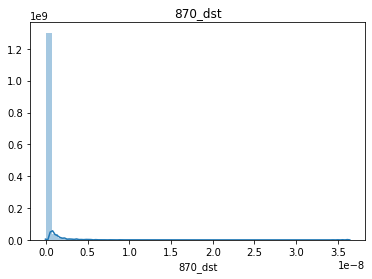

880_dst plot


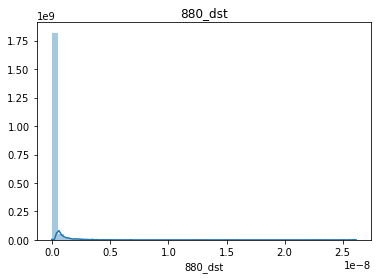

890_dst plot


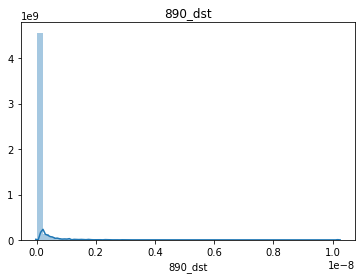

900_dst plot


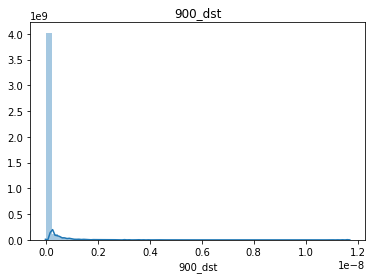

910_dst plot


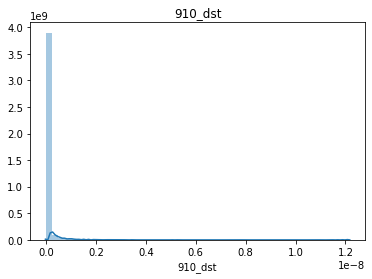

920_dst plot


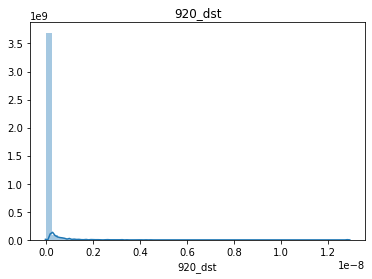

930_dst plot


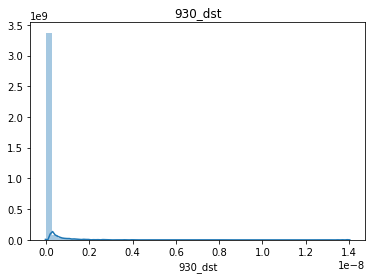

940_dst plot


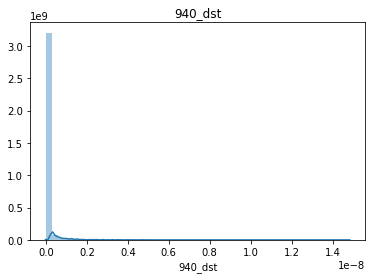

950_dst plot


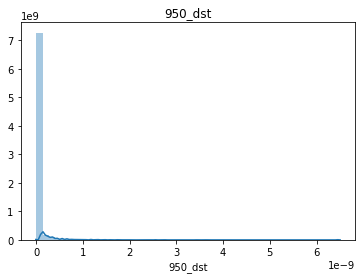

960_dst plot


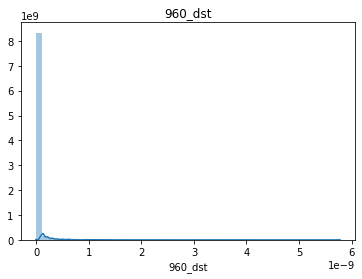

970_dst plot


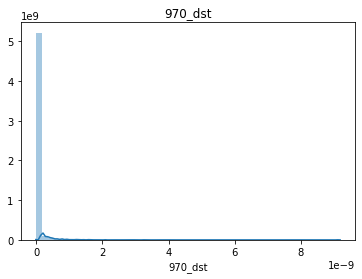

980_dst plot


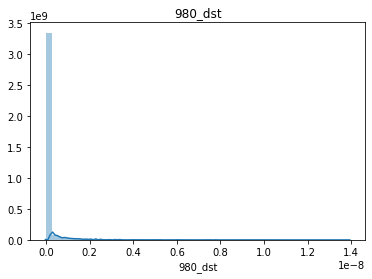

990_dst plot


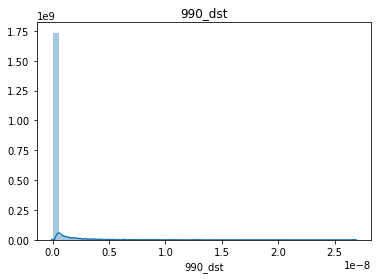

In [18]:
df_col_distplot(filled_feature)

In [19]:
min_max_scaler = MinMaxScaler()
fitted = min_max_scaler.fit(filled_feature)
mm_scaled_feature = min_max_scaler.transform(filled_feature)
mm_scaled_feature = pd.DataFrame(mm_scaled_feature, columns=filled_feature.columns, index=list(filled_feature.index.values))

In [20]:
mm_scaled_feature.shape

(20000, 70)

650_src plot


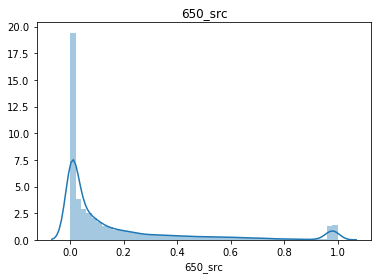

660_src plot


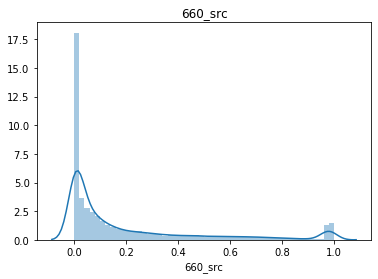

670_src plot


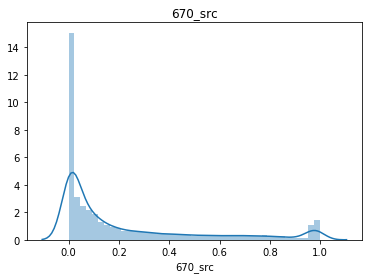

680_src plot


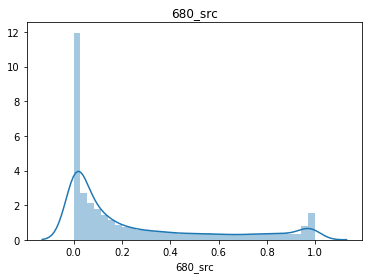

690_src plot


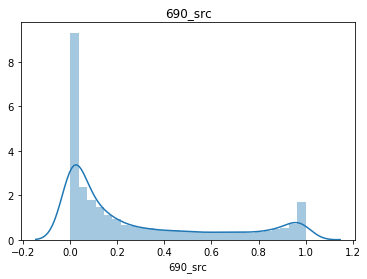

700_src plot


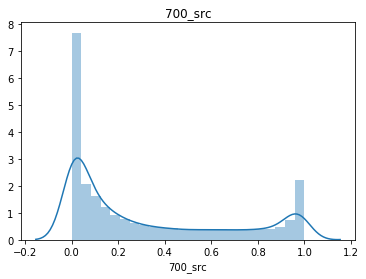

710_src plot


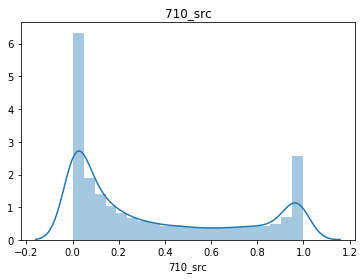

720_src plot


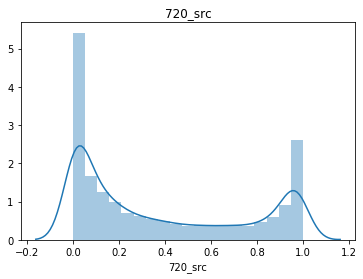

730_src plot


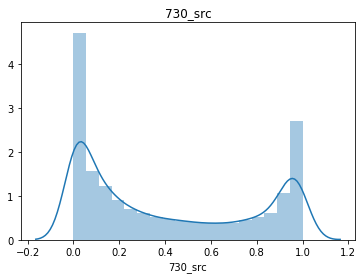

740_src plot


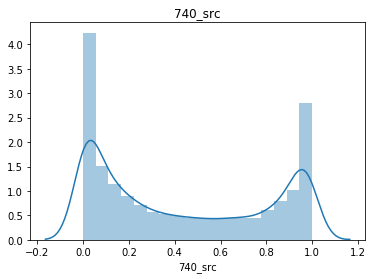

750_src plot


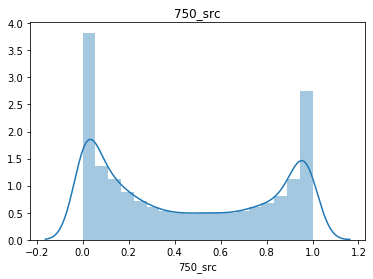

760_src plot


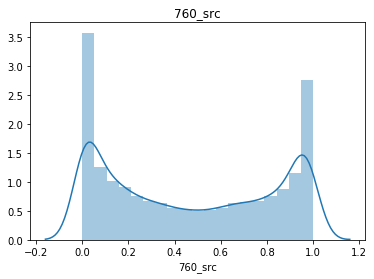

770_src plot


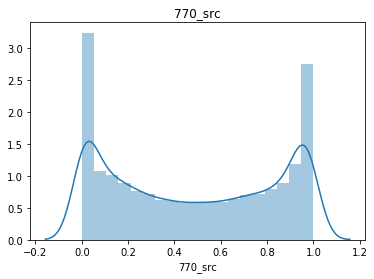

780_src plot


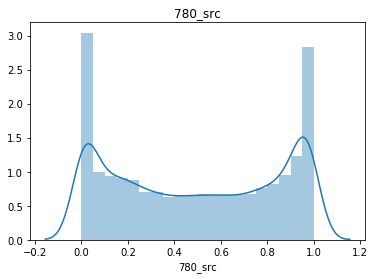

790_src plot


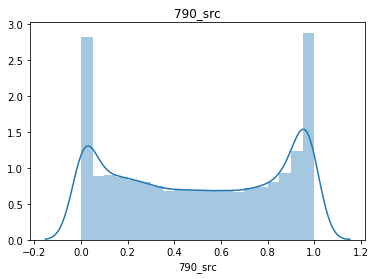

800_src plot


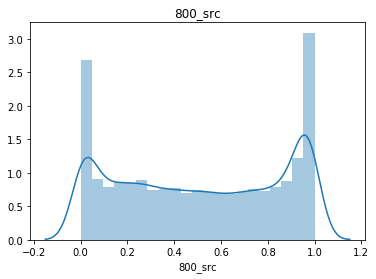

810_src plot


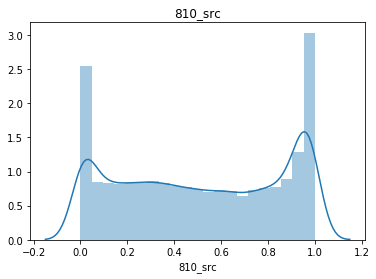

820_src plot


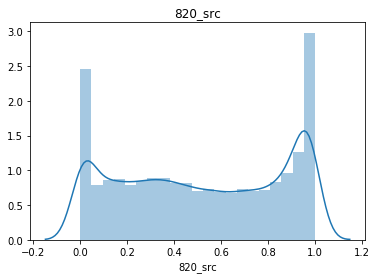

830_src plot


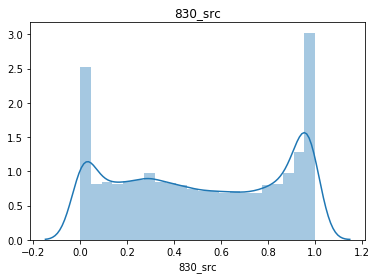

840_src plot


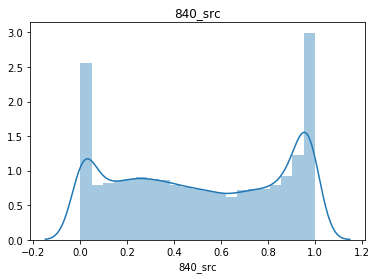

850_src plot


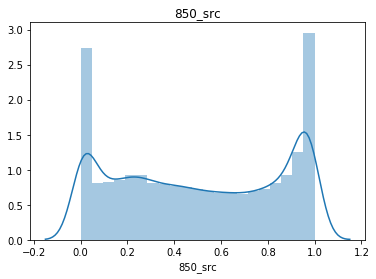

860_src plot


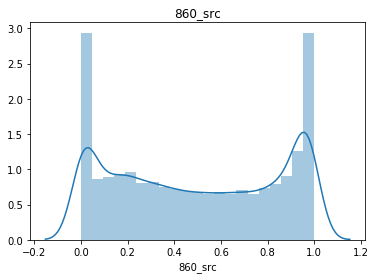

870_src plot


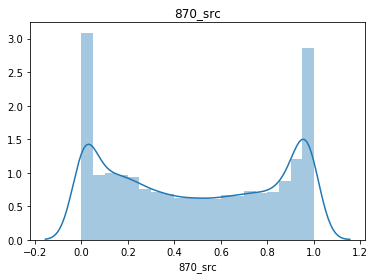

880_src plot


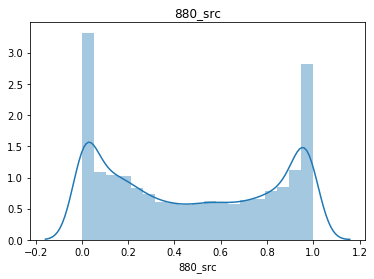

890_src plot


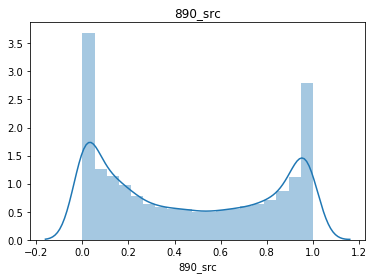

900_src plot


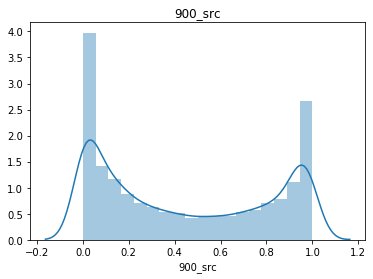

910_src plot


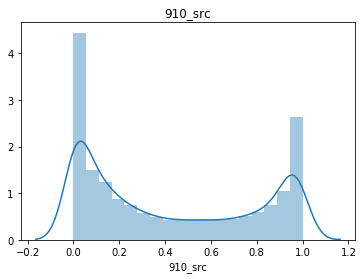

920_src plot


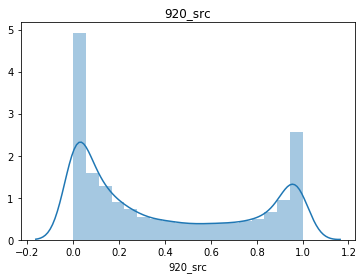

930_src plot


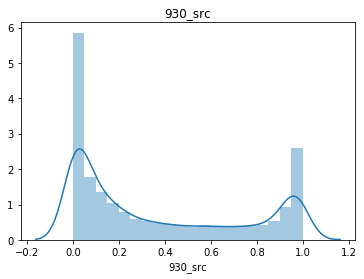

940_src plot


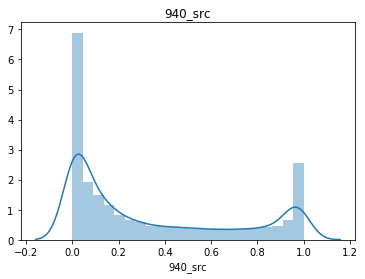

950_src plot


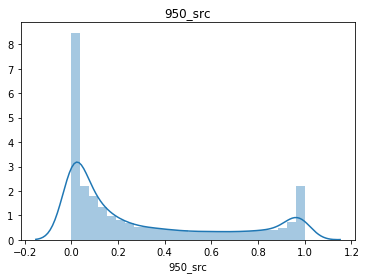

960_src plot


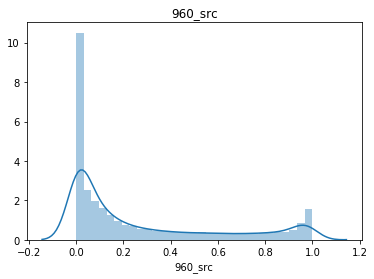

970_src plot


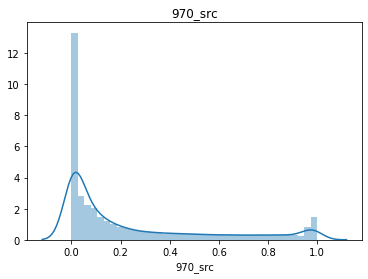

980_src plot


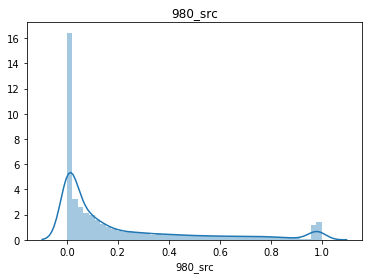

990_src plot


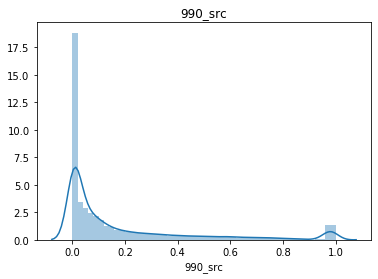

650_dst plot


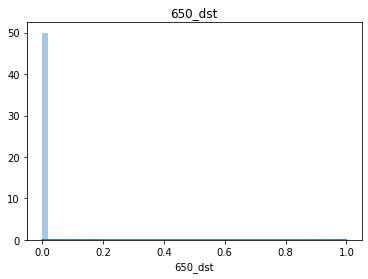

660_dst plot


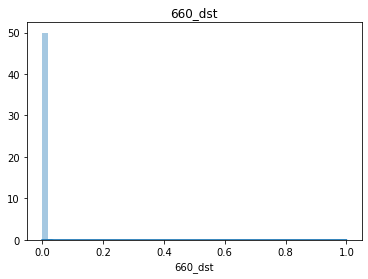

670_dst plot


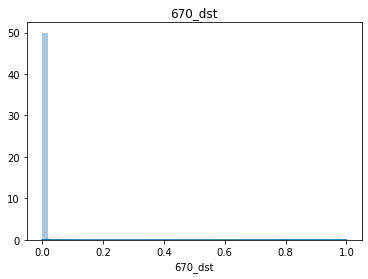

680_dst plot


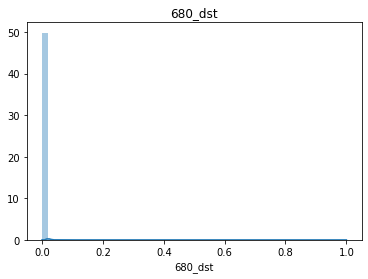

690_dst plot


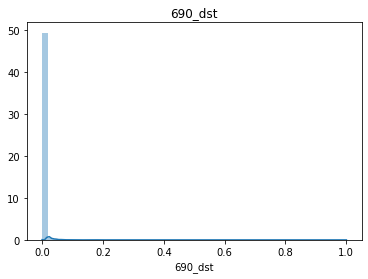

700_dst plot


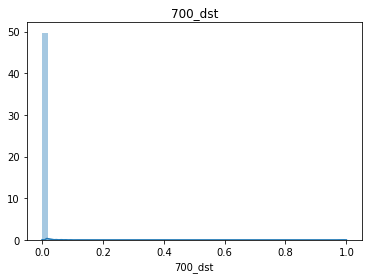

710_dst plot


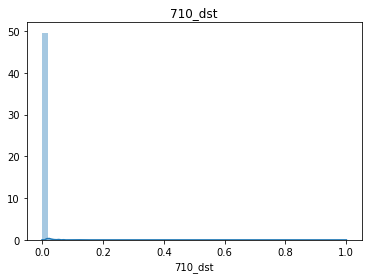

720_dst plot


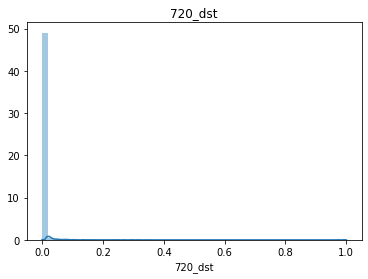

730_dst plot


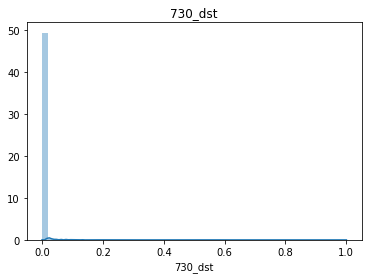

740_dst plot


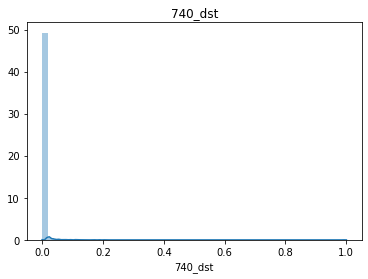

750_dst plot


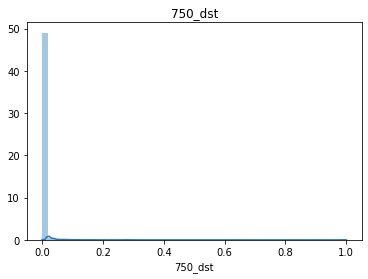

760_dst plot


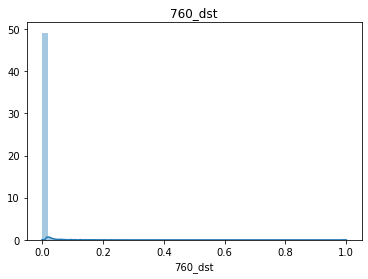

770_dst plot


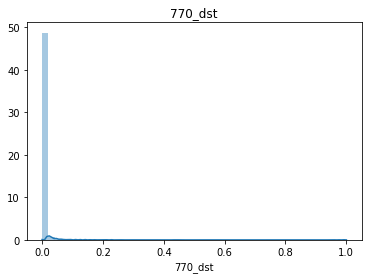

780_dst plot


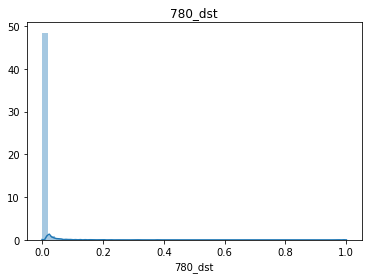

790_dst plot


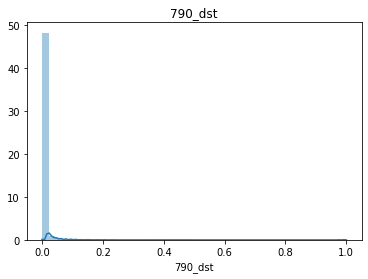

800_dst plot


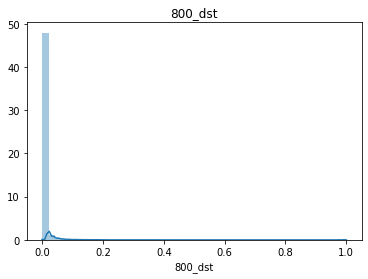

810_dst plot


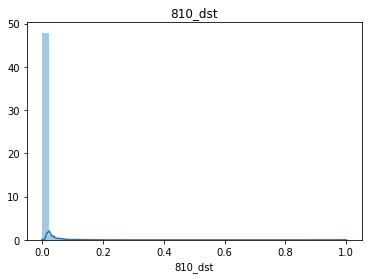

820_dst plot


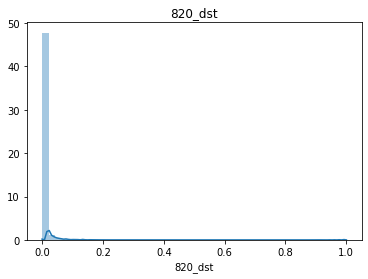

830_dst plot


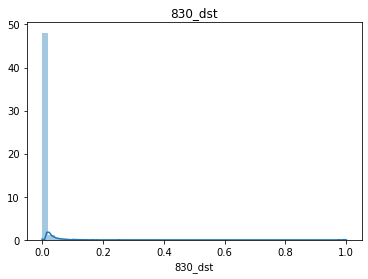

840_dst plot


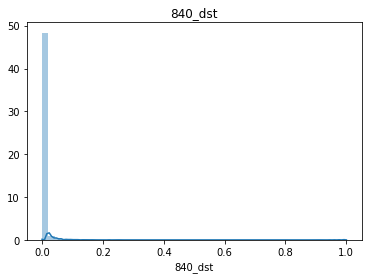

850_dst plot


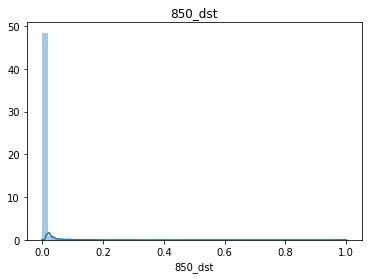

860_dst plot


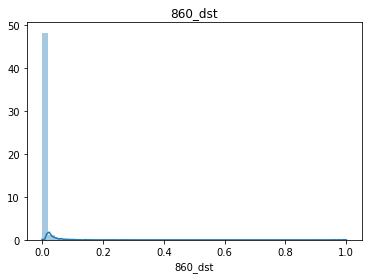

870_dst plot


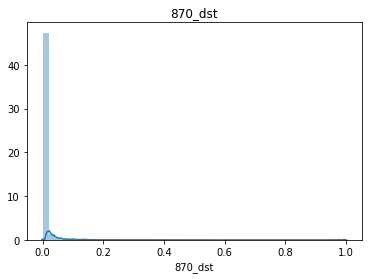

880_dst plot


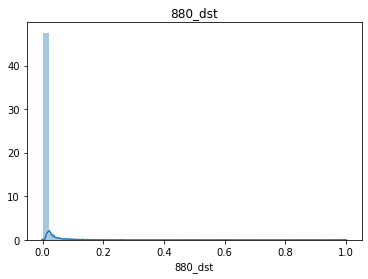

890_dst plot


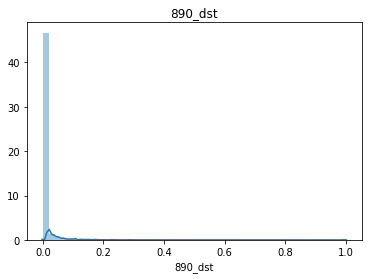

900_dst plot


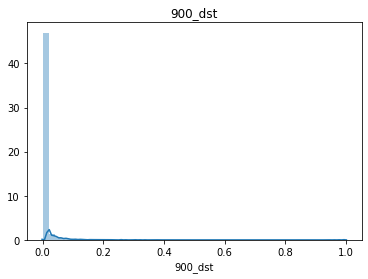

910_dst plot


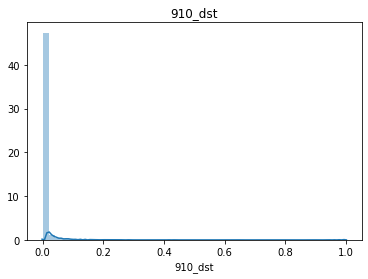

920_dst plot


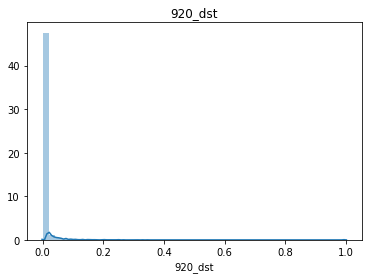

930_dst plot


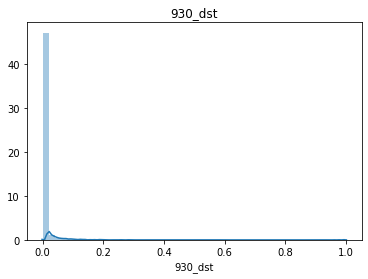

940_dst plot


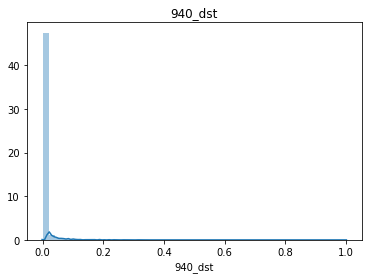

950_dst plot


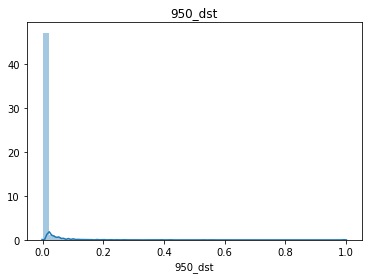

960_dst plot


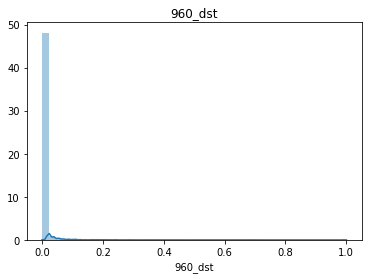

970_dst plot


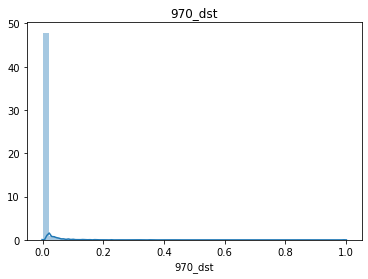

980_dst plot


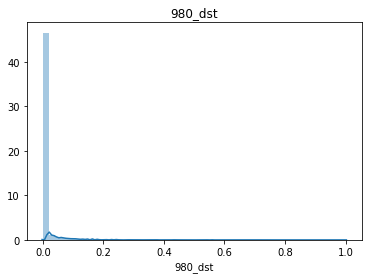

990_dst plot


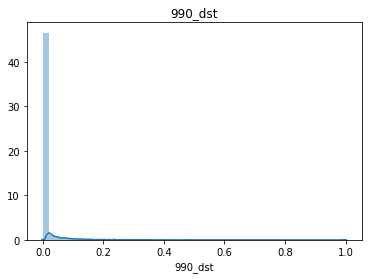

In [21]:
df_col_distplot(mm_scaled_feature)

In [22]:
std_scaler = StandardScaler()
fitted = std_scaler.fit(filled_feature)
std_scaled_feature = std_scaler.transform(filled_feature)
std_scaled_feature = pd.DataFrame(std_scaled_feature, columns=filled_feature.columns, index=list(filled_feature.index.values))

In [23]:
std_scaled_feature.head()

,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,740_src,...,900_dst,910_dst,920_dst,930_dst,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst
0,0.733433,0.786592,0.951760,0.963029,1.133476,1.207972,1.298452,1.453511,1.435435,1.509874,...,-3.959811e-16,-2.372831e-01,2.258571e-16,-0.234308,-1.104487e-15,-0.206758,2.360627e-16,-1.917192e-01,-2.488071e-01,-2.578818e-01
1,-0.662554,-0.707615,-0.693873,-0.800497,-0.850550,-0.848762,-0.951857,-1.019855,-1.083122,-1.116091,...,7.871317e+00,-1.606266e-15,1.805999e+01,35.159247,3.935605e+01,28.843885,1.397890e+01,-5.478867e-16,2.030523e+01,-8.771254e-16
2,-0.662554,-0.593307,-0.674131,-0.689131,-0.679612,-0.651741,-0.556629,-0.529055,-0.414247,-0.352500,...,-2.403831e-01,-2.372831e-01,-2.308654e-01,-0.234308,-2.226019e-01,-0.206758,-1.713933e-01,-1.917192e-01,-2.488071e-01,-8.771254e-16
3,0.349141,0.379545,0.323864,0.465586,0.512360,0.572584,0.779221,0.923532,1.004891,1.246377,...,1.502077e-01,-2.604551e-02,2.258571e-16,0.231514,4.392361e-01,0.410837,3.454995e-01,-5.478867e-16,6.167238e-01,-8.771254e-16
4,3.071887,2.798157,2.485780,2.249688,2.126834,1.939869,1.742492,1.574877,1.572196,1.475166,...,-2.403831e-01,-1.606266e-15,-2.308117e-01,-0.234168,-2.221723e-01,-0.206341,2.360627e-16,-1.911257e-01,-7.660415e-16,-8.771254e-16


650_src plot


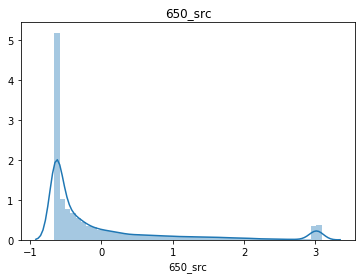

660_src plot


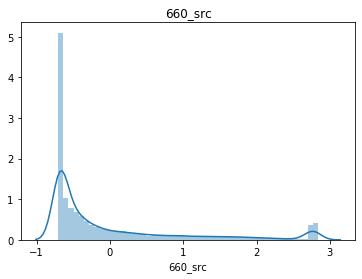

670_src plot


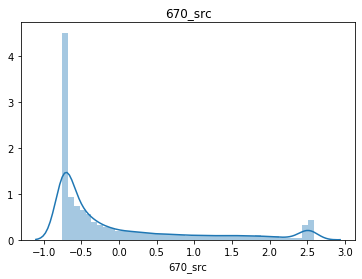

680_src plot


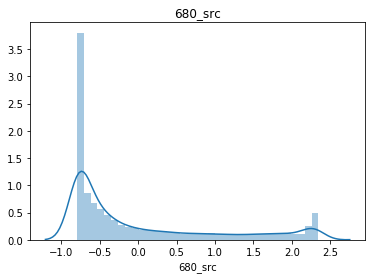

690_src plot


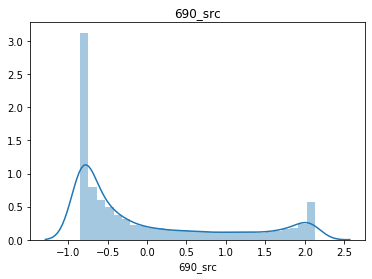

700_src plot


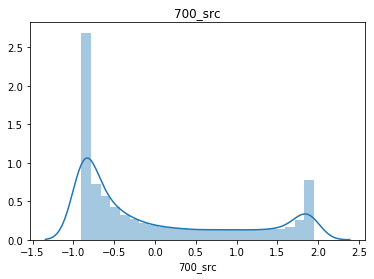

710_src plot


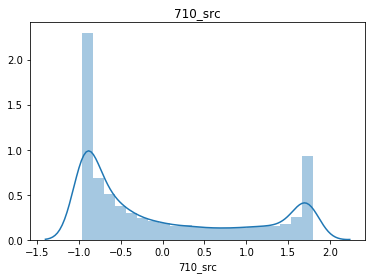

720_src plot


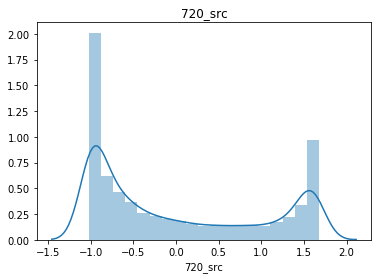

730_src plot


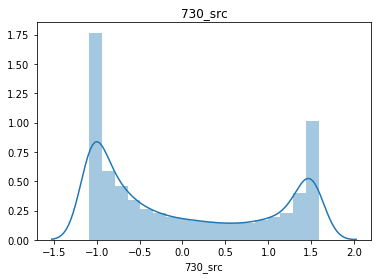

740_src plot


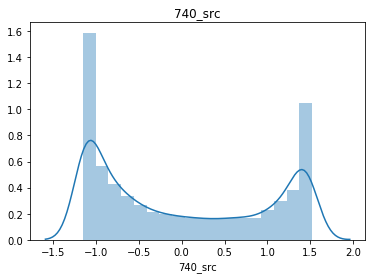

750_src plot


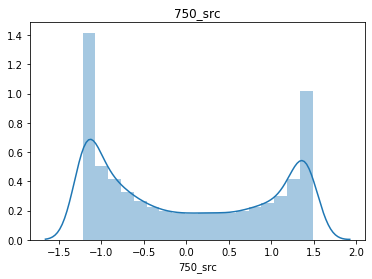

760_src plot


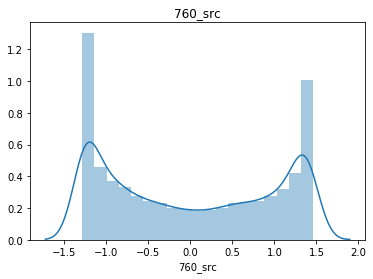

770_src plot


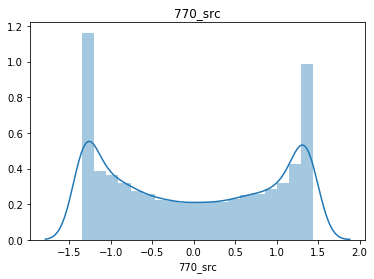

780_src plot


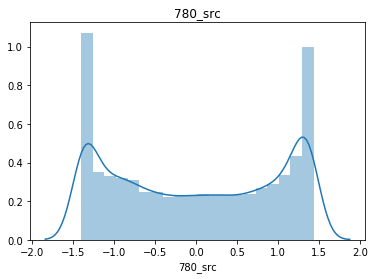

790_src plot


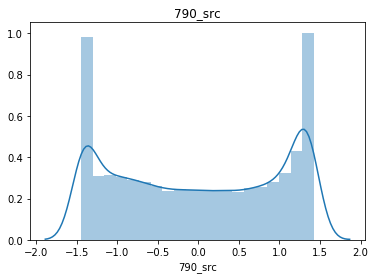

800_src plot


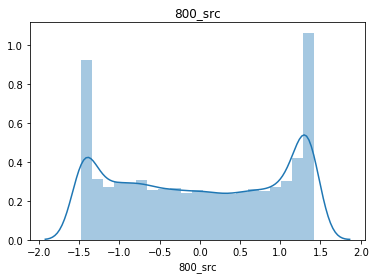

810_src plot


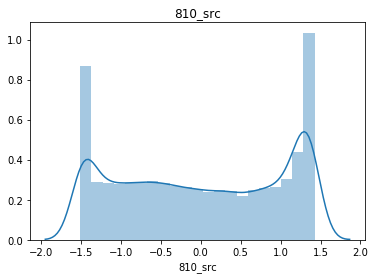

820_src plot


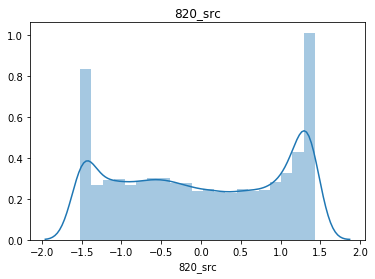

830_src plot


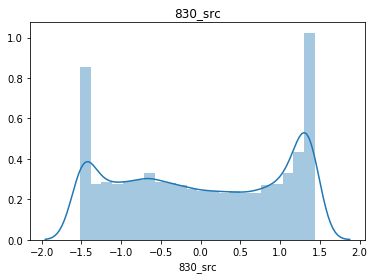

840_src plot


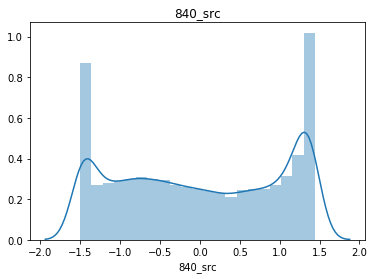

850_src plot


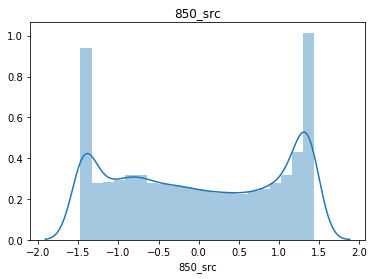

860_src plot


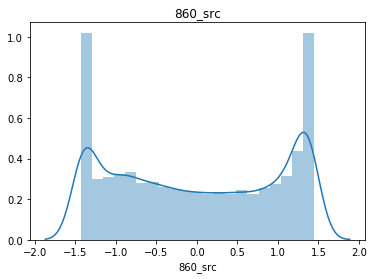

870_src plot


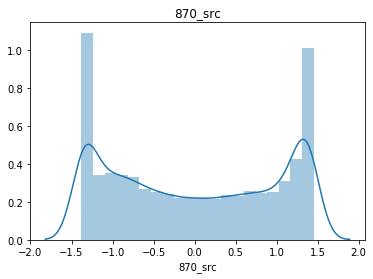

880_src plot


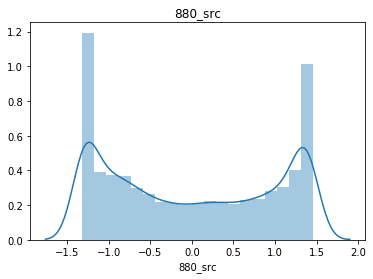

890_src plot


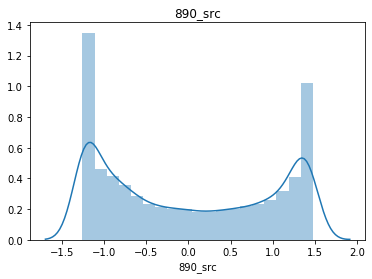

900_src plot


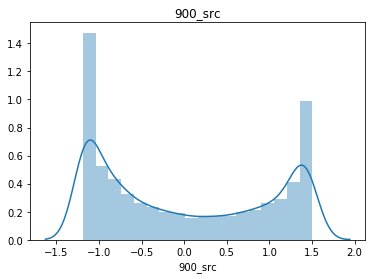

910_src plot


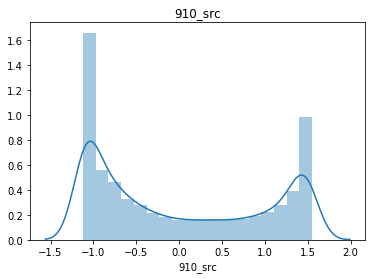

920_src plot


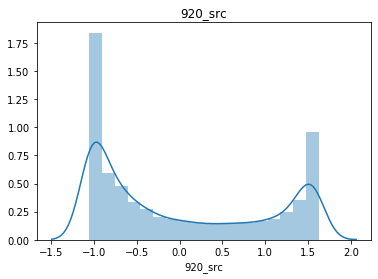

930_src plot


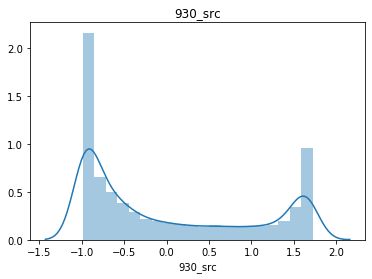

940_src plot


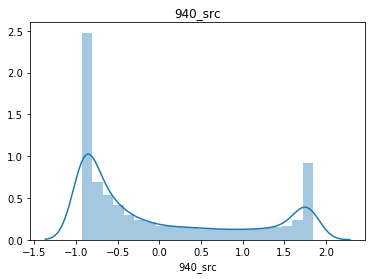

950_src plot


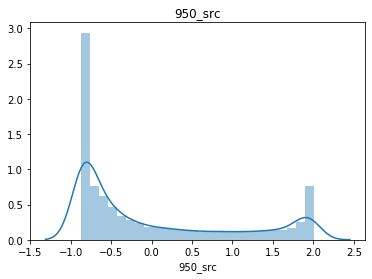

960_src plot


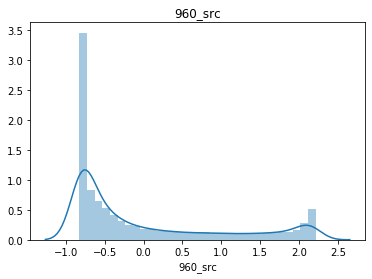

970_src plot


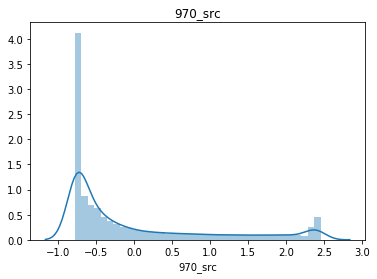

980_src plot


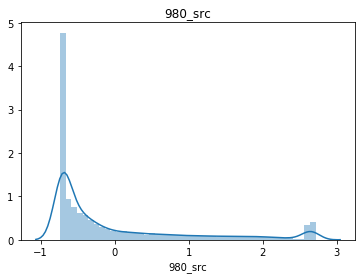

990_src plot


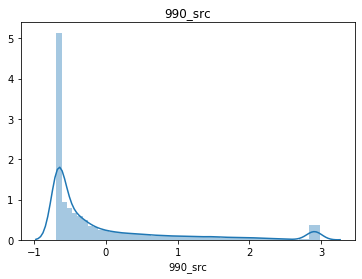

650_dst plot


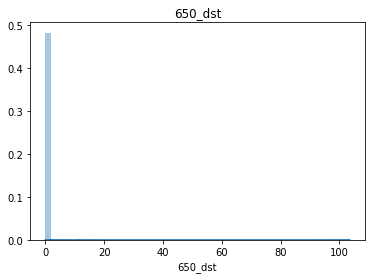

660_dst plot


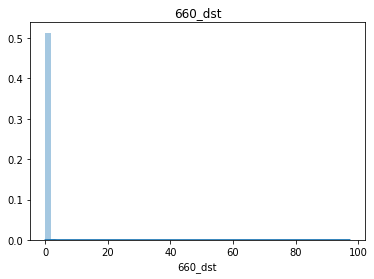

670_dst plot


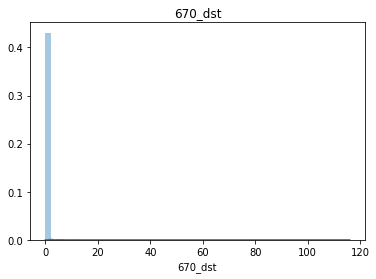

680_dst plot


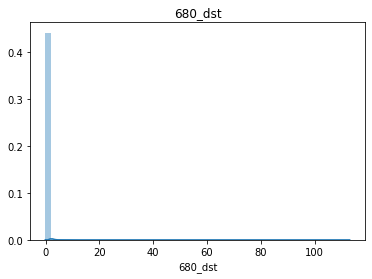

690_dst plot


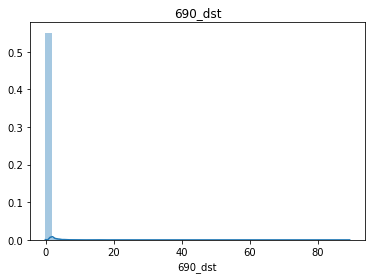

700_dst plot


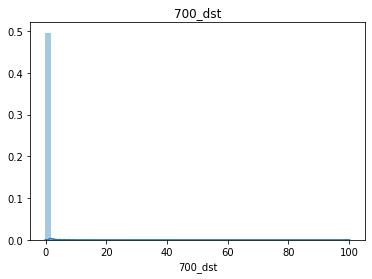

710_dst plot


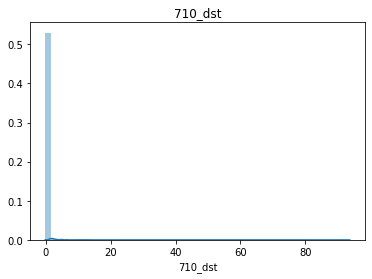

720_dst plot


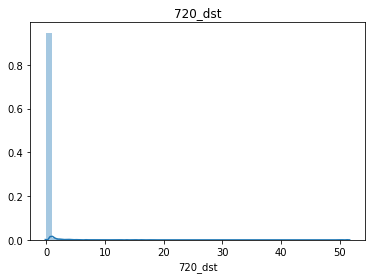

730_dst plot


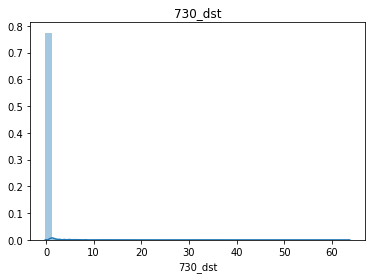

740_dst plot


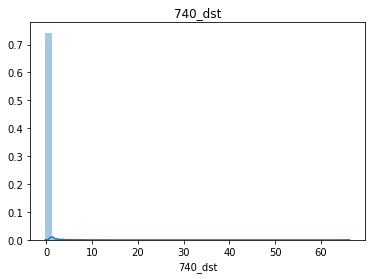

750_dst plot


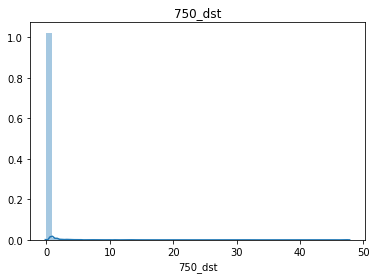

760_dst plot


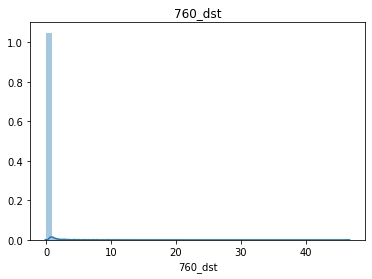

770_dst plot


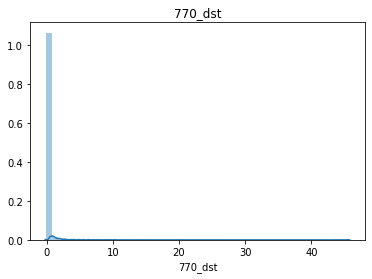

780_dst plot


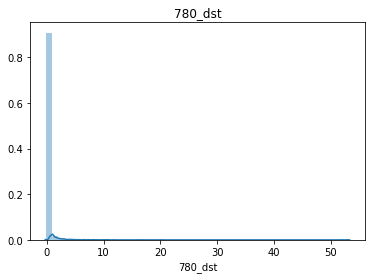

790_dst plot


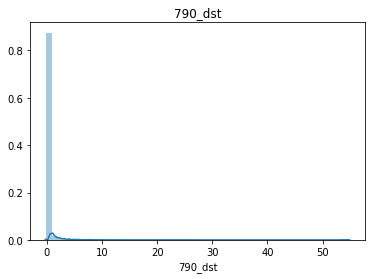

800_dst plot


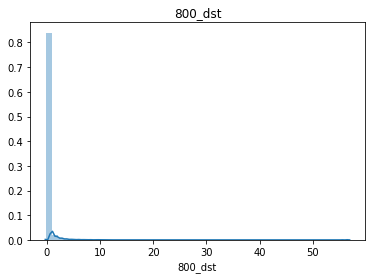

810_dst plot


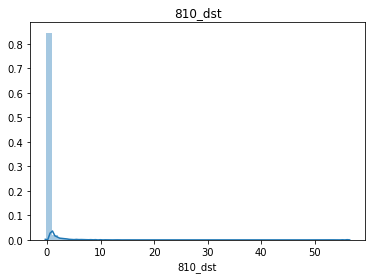

820_dst plot


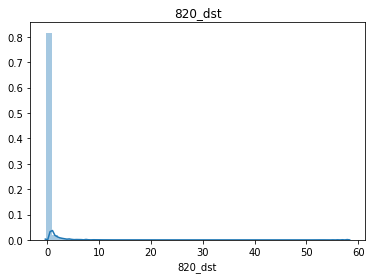

830_dst plot


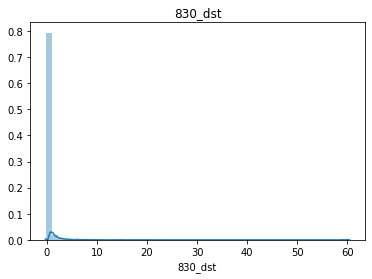

840_dst plot


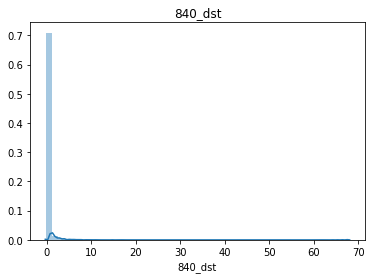

850_dst plot


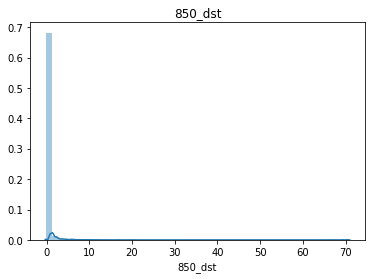

860_dst plot


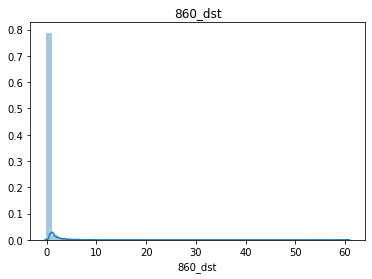

870_dst plot


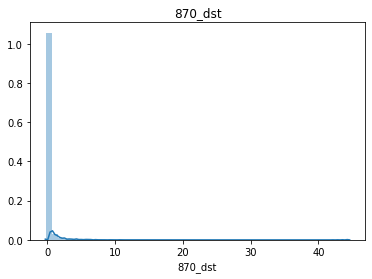

880_dst plot


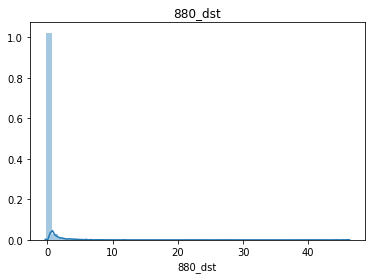

890_dst plot


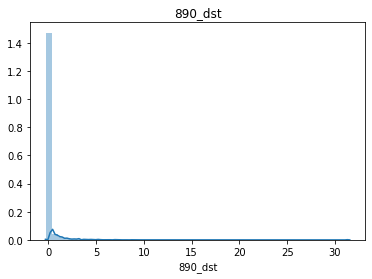

900_dst plot


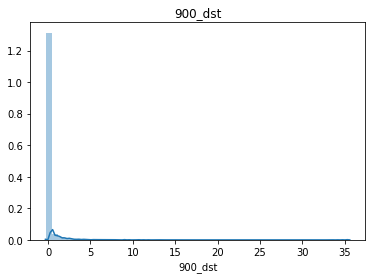

910_dst plot


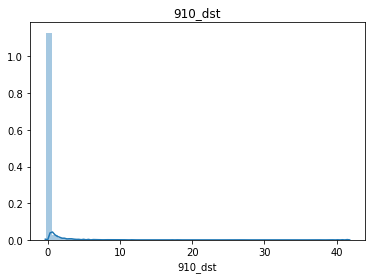

920_dst plot


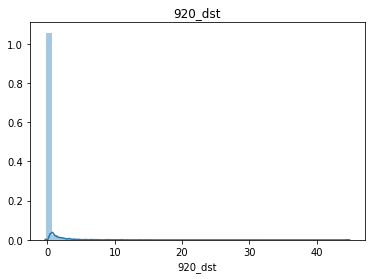

930_dst plot


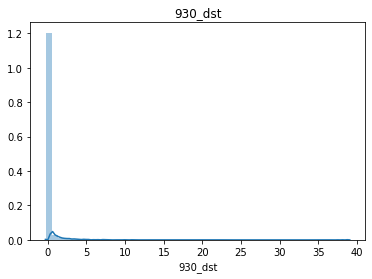

940_dst plot


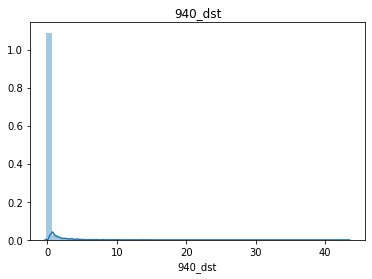

950_dst plot


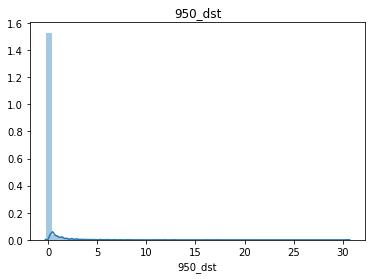

960_dst plot


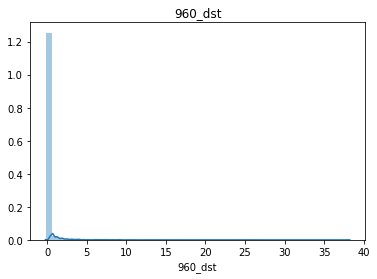

970_dst plot


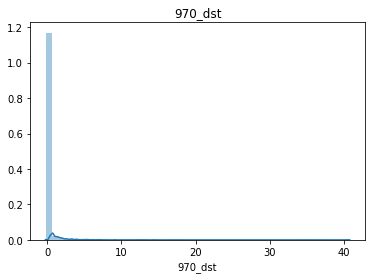

980_dst plot


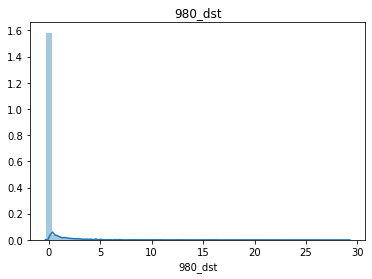

990_dst plot


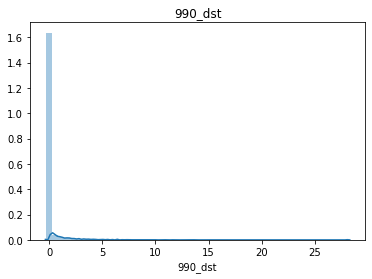

In [24]:
df_col_distplot(std_scaled_feature)

In [25]:
# std_scaled_feature.hist(bins=50, figsize=(20,15))

In [26]:
reunion_df = concat_df.copy(deep=True)

In [27]:
reunion_df.head()

,rho,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,...,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst,hhb,hbo2,ca,na
id,,,,,,,,,,,,,,,,,,,,,
0,25,0.37950,0.42993,0.52076,0.57166,0.67818,0.75476,0.83580,0.93623,0.96333,...,NaN,0.000000e+00,NaN,1.067504e-18,5.998949e-18,4.378513e-17,5.59,4.32,8.92,4.29
1,10,0.00000,0.00000,0.01813,0.00000,0.00000,0.01974,0.00321,0.00000,0.00000,...,1.343132e-08,6.112685e-09,2.130547e-09,NaN,9.710091e-09,NaN,0.00,2.83,7.25,4.64
2,25,0.00000,0.03289,0.02416,0.03610,0.05843,0.09015,0.14944,0.18578,0.25584,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.329725e-18,NaN,10.64,3.00,8.40,5.16
3,10,0.27503,0.31281,0.32898,0.41041,0.46587,0.52769,0.64369,0.73562,0.79865,...,2.245998e-10,1.299511e-10,7.782625e-11,NaN,4.088921e-10,NaN,5.67,4.01,5.05,4.35
4,15,1.01521,1.00872,0.98930,0.98874,1.01773,1.01632,1.00009,0.98217,1.01564,...,1.457955e-13,8.769053e-14,NaN,1.330237e-13,NaN,NaN,11.97,4.41,10.78,2.42


In [28]:
for col in std_scaled_feature.columns:
    reunion_df[col] = std_scaled_feature[col]

In [29]:
reunion_df.head()

,rho,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,...,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst,hhb,hbo2,ca,na
id,,,,,,,,,,,,,,,,,,,,,
0,25,0.733433,0.786592,0.951760,0.963029,1.133476,1.207972,1.298452,1.453511,1.435435,...,-1.104487e-15,-0.206758,2.360627e-16,-1.917192e-01,-2.488071e-01,-2.578818e-01,5.59,4.32,8.92,4.29
1,10,-0.662554,-0.707615,-0.693873,-0.800497,-0.850550,-0.848762,-0.951857,-1.019855,-1.083122,...,3.935605e+01,28.843885,1.397890e+01,-5.478867e-16,2.030523e+01,-8.771254e-16,0.00,2.83,7.25,4.64
2,25,-0.662554,-0.593307,-0.674131,-0.689131,-0.679612,-0.651741,-0.556629,-0.529055,-0.414247,...,-2.226019e-01,-0.206758,-1.713933e-01,-1.917192e-01,-2.488071e-01,-8.771254e-16,10.64,3.00,8.40,5.16
3,10,0.349141,0.379545,0.323864,0.465586,0.512360,0.572584,0.779221,0.923532,1.004891,...,4.392361e-01,0.410837,3.454995e-01,-5.478867e-16,6.167238e-01,-8.771254e-16,5.67,4.01,5.05,4.35
4,15,3.071887,2.798157,2.485780,2.249688,2.126834,1.939869,1.742492,1.574877,1.572196,...,-2.221723e-01,-0.206341,2.360627e-16,-1.911257e-01,-7.660415e-16,-8.771254e-16,11.97,4.41,10.78,2.42


In [30]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor


model = LGBMRegressor(objective='regression', num_iterations=10**3)
# xgbr = XGBRegressor(n_estimators=2000, learning_rate=0.05, colsample_bylevel=1,  colsample_bytree=1, max_depth=3)
# lgbmr = LGBMRegressor(colsample_bylevel= 0.5, colsample_bytree= 0.7, max_depth= 3, n_estimators= 1500)

In [31]:
reunion_train = reunion_df[reunion_df['hhb'].notnull()]
reunion_test = reunion_df[reunion_df['hhb'].isnull()]

In [32]:
reunion_test

,rho,650_src,660_src,670_src,680_src,690_src,700_src,710_src,720_src,730_src,...,940_dst,950_dst,960_dst,970_dst,980_dst,990_dst,hhb,hbo2,ca,na
id,,,,,,,,,,,,,,,,,,,,,
10000,15,-0.095846,0.101299,0.260969,0.524446,0.649186,0.846500,1.048715,1.236748,1.291171,...,-0.222602,-2.067281e-01,-1.712983e-01,-1.917192e-01,-7.660415e-16,-2.578042e-01,NaN,NaN,NaN,NaN
10001,15,1.123427,1.271280,1.459204,1.639337,1.639473,1.686604,1.690112,1.573820,1.496743,...,-0.222460,-5.221112e-16,-1.712417e-01,-1.913913e-01,-2.485406e-01,-2.576326e-01,NaN,NaN,NaN,NaN
10002,10,1.062033,1.241600,1.291147,1.456802,1.540298,1.656831,1.601731,1.598416,1.564274,...,-0.176361,-1.770912e-01,2.360627e-16,-1.373248e-01,-7.660415e-16,-8.771254e-16,NaN,NaN,NaN,NaN
10003,10,-0.408554,-0.446365,-0.418428,-0.340690,-0.377143,-0.353900,-0.255513,-0.048901,0.261531,...,-0.176308,-2.067582e-01,-1.713933e-01,-1.769751e-01,-1.618897e-01,-8.771254e-16,NaN,NaN,NaN,NaN
10004,25,-0.653247,-0.681306,-0.699243,-0.796548,-0.850550,-0.903999,-0.957695,-0.967679,-1.083122,...,-0.222602,-2.067580e-01,-1.713933e-01,-1.917192e-01,-2.488067e-01,-2.578795e-01,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,15,-0.503128,-0.593655,-0.561602,-0.674941,-0.625168,-0.684088,-0.793826,-0.784652,-0.852190,...,-0.220265,-2.067582e-01,-1.713933e-01,-1.910623e-01,-2.456749e-01,-2.521648e-01,NaN,NaN,NaN,NaN
19996,25,-0.661818,-0.637793,-0.696722,-0.682777,-0.607732,-0.661087,-0.547008,-0.541709,-0.445803,...,-0.222602,-5.221112e-16,-1.713933e-01,-5.478867e-16,-2.488071e-01,-2.578818e-01,NaN,NaN,NaN,NaN
19997,15,-0.662554,-0.707615,-0.749303,-0.800497,-0.723378,-0.487571,0.144445,1.103256,1.562130,...,-0.222579,-5.221112e-16,-1.713849e-01,-1.917128e-01,-2.488071e-01,-2.576969e-01,NaN,NaN,NaN,NaN


In [33]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def rmsle(y, pred):
    log_y = np.log1p(y)
    log_pred = np.log1p(pred)
    squared_error = (log_y - log_pred) ** 2
    rmsle = np.sqrt(np.mean(squared_error))
    return rmsle

def rmse(y, pred):
    return np.sqrt(mean_squared_error(y, pred))

In [34]:
feature_col = reunion_df.columns.drop(['hhb', 'hbo2', 'ca', 'na'])
feature_col

Index(['rho', '650_src', '660_src', '670_src', '680_src', '690_src', '700_src',
       '710_src', '720_src', '730_src', '740_src', '750_src', '760_src',
       '770_src', '780_src', '790_src', '800_src', '810_src', '820_src',
       '830_src', '840_src', '850_src', '860_src', '870_src', '880_src',
       '890_src', '900_src', '910_src', '920_src', '930_src', '940_src',
       '950_src', '960_src', '970_src', '980_src', '990_src', '650_dst',
       '660_dst', '670_dst', '680_dst', '690_dst', '700_dst', '710_dst',
       '720_dst', '730_dst', '740_dst', '750_dst', '760_dst', '770_dst',
       '780_dst', '790_dst', '800_dst', '810_dst', '820_dst', '830_dst',
       '840_dst', '850_dst', '860_dst', '870_dst', '880_dst', '890_dst',
       '900_dst', '910_dst', '920_dst', '930_dst', '940_dst', '950_dst',
       '960_dst', '970_dst', '980_dst', '990_dst'],
      dtype='object')

In [35]:
# standard scale & nan 을 평균으로 채웠을때

target_col_list = ['hhb', 'hbo2', 'ca', 'na']
feature_col = reunion_df.columns.drop(target_col_list)

for target_col in target_col_list:
    x_data = reunion_train[feature_col]
    y_data = reunion_train[target_col]
    x_train, x_val, y_train, y_val = train_test_split(x_data, y_data, random_state=0)

    lgbmr = LGBMRegressor(objective='regression', num_iterations=10**3, n_estimators= 2000)
    lgbmr.fit(x_train, y_train, eval_set=[(x_val, y_val)], early_stopping_rounds=100, verbose=False)

    # print(y_val)
    # print(type(y_val))
    # print(y_val.index)

    val_pred = lgbmr.predict(x_val)
    val_pred = pd.DataFrame(val_pred, columns=[target_col], index=list(y_val.index))
    score = rmse(val_pred, y_val)
    print(target_col,'::',score)

    test_x = reunion_test[feature_col]
    test_pred = lgbmr.predict(test_x)
    submission[target_col] = test_pred



hhb :: 1.3301481954790773
hbo2 :: 0.8443045423734262
ca :: 2.512003772808809
na :: 1.7531668230541402


In [36]:
# min-max scale & nan 을 평균으로 채웠을때

target_col_list = ['hhb', 'hbo2', 'ca', 'na']
feature_col = reunion_df.columns.drop(target_col_list)
mm_scaled_feature['rho'] = reunion_train['rho']
mm_train = mm_scaled_feature[:10000]
mm_train.shape

for target_col in target_col_list:
    x_data = mm_train[feature_col]
    y_data = reunion_train[target_col]
    x_train, x_val, y_train, y_val = train_test_split(x_data, y_data, random_state=0)

    lgbmr = LGBMRegressor(objective='regression', num_iterations=10**3, n_estimators= 2000)
    lgbmr.fit(x_train, y_train, eval_set=[(x_val, y_val)], early_stopping_rounds=100, verbose=False)

    # print(y_val)
    # print(type(y_val))
    # print(y_val.index)

    val_pred = lgbmr.predict(x_val)
    val_pred = pd.DataFrame(val_pred, columns=[target_col], index=list(y_val.index))
    score = rmse(val_pred, y_val)
    print(target_col,'::',score)

    test_x = reunion_test[feature_col]
    test_pred = lgbmr.predict(test_x)
    submission[target_col] = test_pred

hhb :: 1.3401154977675644
hbo2 :: 0.849463263985518
ca :: 2.503469237684864
na :: 1.7581869665983914


In [37]:
## null 값이 없는 col 만으로 추측할 때

target_col_list = ['hhb', 'hbo2', 'ca', 'na']
feature_col = [
    'rho', '650_src', '660_src', '670_src', '680_src', '690_src', '700_src',
    '710_src', '720_src', '730_src', '740_src', '750_src', '760_src',
    '770_src', '780_src', '790_src', '800_src', '810_src', '820_src',
    '830_src', '840_src', '850_src', '860_src', '870_src', '880_src',
    '890_src', '900_src', '910_src', '920_src', '930_src', '940_src',
    '950_src', '960_src', '970_src', '980_src', '990_src'
]

for target_col in target_col_list:
    x_data = reunion_train[feature_col]
    y_data = reunion_train[target_col]
    x_train, x_val, y_train, y_val = train_test_split(x_data, y_data, random_state=0)

    lgbmr = LGBMRegressor(objective='regression', num_iterations=10**3, n_estimators= 2000)
    lgbmr.fit(x_train, y_train, eval_set=[(x_val, y_val)], early_stopping_rounds=100, verbose=False)

    # print(y_val)
    # print(type(y_val))
    # print(y_val.index)

    val_pred = lgbmr.predict(x_val)
    val_pred = pd.DataFrame(val_pred, columns=[target_col], index=list(y_val.index))
    score = rmse(val_pred, y_val)
    print(target_col,'::',score)

    test_x = reunion_test[feature_col]
    test_pred = lgbmr.predict(test_x)
    submission[target_col] = test_pred

hhb :: 2.9198465931934328
hbo2 :: 0.9963477081058216
ca :: 2.9567741371829235
na :: 1.9159930902243922


In [38]:
submission

,hhb,hbo2,ca,na
id,,,,
10000,8.170026,4.045987,8.833595,3.034111
10001,8.228263,3.993295,8.994592,3.034111
10002,8.053014,3.993295,8.994592,3.034111
10003,8.021953,3.999938,9.027352,3.034111
10004,8.060836,3.999938,8.986699,2.889702
...,...,...,...,...
19995,7.911592,4.019008,9.053291,3.034111
19996,8.070874,3.999938,8.588692,3.034111
19997,7.693885,3.984741,9.312377,3.034111


In [39]:
import time
filename = time.strftime('%Y-%m-%d-%H_%M_%S')+'submission.csv'
submission.to_csv(filename, index=True)